In [24]:
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import os
import math
import json
from sklearn.model_selection import train_test_split
from pydub import AudioSegment
import IPython.display as ipd

In [25]:
file = './Train_submission/Sound_Drum/epic_battle_music_1-6275.wav'

In [34]:
DATASET_PATH ="./Train_submission"
JSON_PATH=""
SAMPLE_RATE=22500
DURATION=10
SAMPLES_PER_TRACK = SAMPLE_RATE * DURATION
JSON_PATH = "data.json"

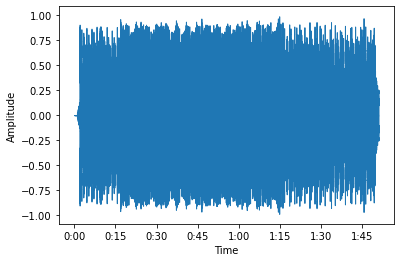

In [35]:
#waveform
signal, sr = librosa.load(file, sr=22050) #sr*T ->22050*10
librosa.display.waveshow(signal, sr=sr)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

In [36]:
print(signal)
print(len(signal))

[ 0.000000e+00  0.000000e+00  0.000000e+00 ... -8.371426e-06 -4.436334e-06
  3.353065e-06]
2444375


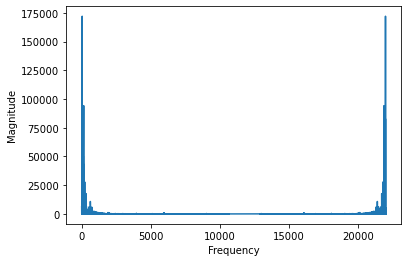

In [37]:
#fft->spectrum
fft = np.fft.fft(signal)
magnitude = np.abs(fft)
frequency = np.linspace(0, sr, len(magnitude))
plt.plot(frequency, magnitude)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()

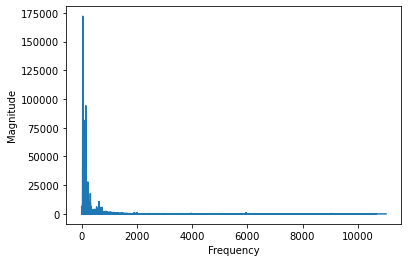

In [38]:
left_frequency = frequency[:int(len(frequency)/2)]
left_magnitude = magnitude[:int(len(magnitude)/2)]
plt.plot(left_frequency, left_magnitude)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()


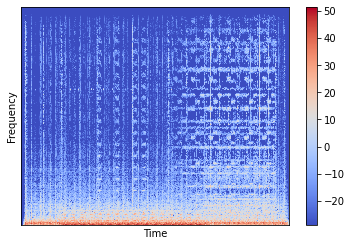

In [39]:
#STFT -> Spectrogram
n_fft = 2048
hop_length = 512

stft = librosa.core.stft(signal, hop_length=hop_length, n_fft=n_fft)
spectrogram = np.abs(stft)
log_spectrogram = librosa.amplitude_to_db(spectrogram)
librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.show()

In [40]:
def normalize_mfccs(mfccs):
    # Calculate mean and std deviation along axis 1 (frames)
    mean = np.mean(mfccs, axis=1)
    std_dev = np.std(mfccs, axis=1)

    # Normalize MFCCs
    normalized_mfccs = (mfccs - mean[:, np.newaxis]) / (std_dev[:, np.newaxis] + 1e-8)

    return normalized_mfccs


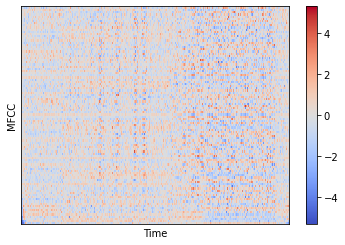

(100, 4775)


In [41]:
#MFCC
MFCCs = librosa.feature.mfcc(y=signal, n_fft=n_fft, hop_length=hop_length, n_mfcc=100)
# librosa.display.specshow(MFCCs, sr=sr, hop_length=hop_length)
mfcc = normalize_mfccs(MFCCs)
librosa.display.specshow(mfcc, sr=sr, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("MFCC")
plt.colorbar()
plt.show()
print(MFCCs.shape)

In [42]:
import soundfile as sf
def convert_to_fixed_size(dataset_path,  target_duration):
    for i, (dirpath, dirname, filenames) in enumerate(os.walk(dataset_path)):
        
        #ensure that we're not at the root level
        if dirpath is not dataset_path:
            #Get the Semantic Label
            dirpath_components = dirpath.split("\\")
            sematic_label = dirpath_components[-1]
                        
            for f in filenames:
                input_file = os.path.join(dirpath, f)
                output_folder = os.path.dirname(dataset_path) +'/fixed'
                
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)
                
                output_file = output_folder + '/'+f
                # Load the audio file
                y, sr = librosa.load(input_file)
                
                target_samples = int(sr*target_duration)
                
                if len(y) > target_samples:
                    y_fixed_length = y[:target_samples]
                else:
                    pad_length = target_samples - len(y)
                    y_fixed_length = np.pad(y, (0, pad_length), 'constant')
                    
                sf.write(output_file, y_fixed_length, sr)
                


In [21]:
convert_to_fixed_size(DATASET_PATH, 10)

In [43]:
fixed_signal, sr = librosa.load(file, duration=10, mono=False, sr=22500)

In [45]:
fixed_signal.shape
ipd.Audio(fixed_signal, rate=sr)

In [18]:
#PREPROCESSING
def save_mfcc(dataset_path, json_path, n_mfcc=50, n_fft=2048, hop_length=512,
             num_segments=55):
    #dictionary to store data
    data = {
        "mapping":[],
        "mfcc":[],
        "labels":[]
    }
    num_samples_per_segment = int(SAMPLES_PER_TRACK/num_segments)
    expected_num_vectors_per_segment = math.ceil(num_samples_per_segment/hop_length)
    #loop through all the audio files
    for i, (dirpath,dirname,filenames) in enumerate(os.walk(dataset_path)):
        
        #ensure that we're not at the root level.
        if dirpath is not dataset_path:
            #save the sematic label
            dirpath_components = dirpath.split("\\") #/data/bus => ['data', bus]
            semantic_label = dirpath_components[-1]
            data["mapping"].append(semantic_label)
            print("\nProcessing {}".format(semantic_label))
#             print("\nDirPath: {}".format(dirpath_components))
            
            for f in filenames:
                file_path = os.path.join(dirpath, f)
                signal, sr = librosa.load(file_path, sr=SAMPLE_RATE)
                
                #process segments  extracting MFCC and storing data
                for s in range(num_segments):
                    start_sample = num_samples_per_segment * s
                    finish_sample = start_sample + num_samples_per_segment
                    
                    mfcc = librosa.feature.mfcc(y=signal[start_sample:finish_sample], sr=sr, n_fft=n_fft,
                                               n_mfcc=n_mfcc, hop_length=hop_length)
                    
                    mfcc = normalize_mfccs(mfcc)
                    
                    mfcc=mfcc.T
                    
                     #store mfcc for segment if it has the expected length
                    if len(mfcc) == expected_num_vectors_per_segment:
                        data["mfcc"].append(mfcc.tolist())
                        data["labels"].append(i-1)
                        print("{}, segment:{}".format(file_path, s))
                        
    with open(json_path, "w") as fp:
        json.dump(data, fp, indent=4)
            
    

In [20]:
save_mfcc(DATASET_PATH, JSON_PATH)


Processing Drum_1
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:0
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:1
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:2
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:3
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:4
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:5
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:6
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:7
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:8
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:9
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:10
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:11
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:12
./Train_submission\Drum_1\epic_battle_music_1-6275.wav, segment:13
./Train_submission\Drum_1\epic_battle_music_1-6275.wa

In [24]:
def load_data(dataset_path):
    with open(dataset_path, "r") as fp:
        data = json.load(fp)
    # convert lists into numpy arrays
    inputs = np.array(data["mfcc"])
    targets = np.array(data["labels"])
    
    return inputs, targets

In [25]:
inputs, targets = load_data("drums_1_data.json")

In [26]:
print("Shape of the input array is {}\n".format(inputs.shape))
print("Shape of the target array is {}\n".format(targets.shape))
print("Shape of the input Train array is {}\n".format(X_train.shape))
print("Shape of the target Train array is {}\n".format(y_train.shape))
print("Lenght of the Target array is {}\n".format(len(targets)))

Shape of the input array is (55, 8, 50)

Shape of the target array is (55,)



NameError: name 'X_train' is not defined

In [54]:
def prepare_datasets(X, Y, test_size, validation_size):
    
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size)
    
    X_train, X_Validation, Y_train, Y_Validation = train_test_split(X_train, Y_train, test_size=validation_size)
    
    #Since the CNN network is expecting 3d array third dimension being the channels
    X_train = X_train[..., np.newaxis] #4d array -> (num_samples, 87, 50, 1)
    X_Validation = X_Validation[..., np.newaxis]
    X_test = [..., np.newaxis]
    
    return X_train, X_Validation, X_test, Y_train, Y_Validation, Y_test
    

In [94]:
#split the data into train and test
X_train, X_Validation, X_test, y_train, y_validation, y_test = prepare_datasets(X=inputs, Y= targets, 
                                                                               test_size=0.25, validation_size=0.2)

Shape of the input array is (23400, 87, 50)

Shape of the target array is (23400,)

Shape of the input Train array is (14040, 87, 50, 1)

Shape of the target Train array is (14040,)

Lenght of the Target array is 23400



In [96]:
input_shape = (X_train.shape[1], X_train[2], X_train[3])

In [97]:
def get_one_hot(targets, nb_classes):
    res = np.eye(nb_classes)[np.array(targets).reshape(-1)]
    return res.reshape(list(targets.shape)+[nb_classes])

In [100]:
Y_train_one_hot = get_one_hot(y_train, 15)
Y_validation_one_hot = get_one_hot(y_validation, 15)
Y_test_one_hot = get_one_hot(y_test, 15)

In [101]:
count = 0
for i in range(len(y_train)):
    
    if y_train[i] == 0:
        print(Y_train_one_hot[i])
        print(y_train[i])
        print("The Index where it is Zero is {}".format(i))
        count = count + 1
        print("The Number of Samples is {}".format(count))

In [105]:
Y_train_one_hot.shape

(14040, 15)

In [130]:
from tensorflow.keras import layers, models, datasets, callbacks, utils, metrics, optimizers
import tensorflow.keras.backend as K
from tensorflow.keras.losses import BinaryCrossentropy, MeanSquaredError

In [131]:
def label_condition_disc(in_shape=(128,128,3), n_classes=3, embedding_dim=100):
    # label input
    con_label = layers.Input(shape=(1,))
    # embedding for categorical input
    label_embedding = layers.Embedding(n_classes, embedding_dim)(con_label)
    nodes = in_shape[0] * in_shape[1] * in_shape[2]
    # scale up to image dimensions with linear layer
    label_dense = layers.Dense(nodes, activation='linear')(label_embedding)
    # reshape to additional channel
    label_reshape = layers.Reshape((in_shape[0], in_shape[1], in_shape[2]))(label_dense)
    # image input
    in_image = layers.Input(shape=in_shape)
    print(in_image.shape)
    # concat label as a channel
    merge = layers.Concatenate()([in_image, label_reshape])
    # downsample
    d = layers.Conv2D(64, (3,3), strides=(2,2), padding='same')(merge)
    d = layers.LeakyReLU(alpha=0.2)(d)
    # downsample
    d = layers.Conv2D(64, (3,3), strides=(2,2), padding='same')(d)
    d = layers.LeakyReLU(alpha=0.2)(d)
    # downsample
    d = layers.Conv2D(64, (3,3), strides=(2,2), padding='same')(d)
    d = layers.LeakyReLU(alpha=0.2)(d)
    # downsample
    d = layers.Conv2D(64, (3,3), strides=(2,2), padding='same')(d)
    d = layers.LeakyReLU(alpha=0.2)(d)
    # classifier
    d = layers.Flatten()(d)
    out_class = layers.Dense(1)(d)
    # define model
    model = Model([in_image, con_label], out_class)
    # compile model
#     opt = Adam(lr=0.0002, beta_1=0.5)
#     model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [132]:
label_condition_disc()

(None, 128, 128, 3)


NameError: name 'Model' is not defined

In [139]:
import tensorflow as tf

# Create a NumPy array
data = np.array([[1, 2], [3, 4], [5, 6]])

# Create a tf.data.Dataset
dataset = tf.data.Dataset.from_tensor_slices(data)

# Perform operations on the dataset (e.g., batch, shuffle)
dataset = dataset.shuffle(buffer_size=3).batch(batch_size=2)

# Iterate through the dataset
for batch in dataset:
    print(batch)

tf.Tensor(
[[3 4]
 [1 2]], shape=(2, 2), dtype=int32)
tf.Tensor([[5 6]], shape=(1, 2), dtype=int32)


In [148]:
X_ = iter(X_train)
index = 0
try:
    while True:
        item = next(X_)
        print(f"Index: {index}, Value: {item}, Shape{item.shape}")
        index += 1
except StopIteration:
    print("End of the sequence")

Index: 0, Value: [[[-309.15213013]
  [ 113.15310669]
  [  28.74039459]
  ...
  [  -0.67869586]
  [  -2.85935259]
  [  -2.94829416]]

 [[-345.08288574]
  [ 121.11508942]
  [  32.34312439]
  ...
  [  -1.29990411]
  [  -3.93575239]
  [  -2.98998594]]

 [[-388.45315552]
  [ 133.90498352]
  [  29.92945099]
  ...
  [  -6.16652584]
  [  -5.30142212]
  [   0.850631  ]]

 ...

 [[-399.86633301]
  [ 131.41795349]
  [  26.89076805]
  ...
  [ -10.87696838]
  [  -1.25507784]
  [   8.31190491]]

 [[-383.55975342]
  [ 127.0091095 ]
  [  28.89401054]
  ...
  [  -3.98407078]
  [   4.08154154]
  [   5.93046331]]

 [[-344.82922363]
  [ 112.66522217]
  [  23.65192986]
  ...
  [   2.29844618]
  [   4.25987339]
  [   2.45164156]]], Shape(87, 50, 1)
Index: 1, Value: [[[-6.54800354e+02]
  [ 1.30921844e+02]
  [ 4.13738403e+01]
  ...
  [-3.48064208e+00]
  [ 2.29865313e-02]
  [-9.37711358e-01]]

 [[-6.42294922e+02]
  [ 1.44711838e+02]
  [ 3.83522568e+01]
  ...
  [ 1.14431143e+00]
  [-1.42735863e+00]
  [-1.599876

  [ 3.20734763e+00]]], Shape(87, 50, 1)
Index: 380, Value: [[[-4.75526459e+02]
  [ 1.17298248e+02]
  [ 1.20424681e+01]
  ...
  [ 4.63090658e-01]
  [ 1.14413095e+00]
  [-6.00994676e-02]]

 [[-5.10387207e+02]
  [ 1.26810394e+02]
  [ 2.10956335e+00]
  ...
  [ 2.86947155e+00]
  [ 8.76455069e-01]
  [-1.22228789e+00]]

 [[-5.92384888e+02]
  [ 1.60629730e+02]
  [-9.30318165e+00]
  ...
  [ 5.19696379e+00]
  [ 5.66475868e+00]
  [-8.16799223e-01]]

 ...

 [[-5.63809570e+02]
  [ 1.76991272e+02]
  [ 5.04219770e+00]
  ...
  [-4.91999245e+00]
  [-3.79042292e+00]
  [-1.44475937e+00]]

 [[-5.56214539e+02]
  [ 1.78846817e+02]
  [ 9.59198475e+00]
  ...
  [-3.04892206e+00]
  [-2.29857922e+00]
  [ 3.86553049e+00]]

 [[-5.65595093e+02]
  [ 1.63576630e+02]
  [ 1.98251362e+01]
  ...
  [-3.27144384e+00]
  [-3.36467123e+00]
  [ 4.66804218e+00]]], Shape(87, 50, 1)
Index: 381, Value: [[[-287.45123291]
  [ 134.38601685]
  [ -32.16171265]
  ...
  [  -0.50952339]
  [   0.73528564]
  [   1.05245233]]

 [[-263.431884

  [-3.21939945e+00]]], Shape(87, 50, 1)
Index: 755, Value: [[[-5.74884766e+02]
  [ 1.47873505e+02]
  [-1.67881536e+00]
  ...
  [ 8.65607619e-01]
  [-3.61352658e+00]
  [-5.59545803e+00]]

 [[-5.56044189e+02]
  [ 1.53616089e+02]
  [-1.59974747e+01]
  ...
  [ 1.86314797e+00]
  [ 6.28135562e-01]
  [-2.38194203e+00]]

 [[-5.60895325e+02]
  [ 1.52253891e+02]
  [-1.81721840e+01]
  ...
  [ 1.68631446e+00]
  [ 3.17421389e+00]
  [-1.09625483e+00]]

 ...

 [[-5.48277954e+02]
  [ 1.62728638e+02]
  [-1.34647579e+01]
  ...
  [-1.04268551e-01]
  [ 3.15832138e+00]
  [ 6.10334206e+00]]

 [[-5.55372131e+02]
  [ 1.58278534e+02]
  [-1.21430950e+01]
  ...
  [-1.46396494e+00]
  [ 2.91803169e+00]
  [ 1.59782362e+00]]

 [[-5.73933472e+02]
  [ 1.49458832e+02]
  [-4.02331161e+00]
  ...
  [-1.65467107e+00]
  [-1.50330591e+00]
  [-2.06104684e+00]]], Shape(87, 50, 1)
Index: 756, Value: [[[-7.00476440e+02]
  [ 3.55685196e+01]
  [ 5.86334152e+01]
  ...
  [-6.25247419e-01]
  [ 7.28866458e-01]
  [-3.19126844e-01]]

 [

  [-1.49200368e+00]]], Shape(87, 50, 1)
Index: 1115, Value: [[[-5.20262390e+02]
  [ 1.00702316e+02]
  [ 1.75869808e+01]
  ...
  [ 2.09887314e+00]
  [-1.70675945e+00]
  [ 6.53078139e-01]]

 [[-5.46505493e+02]
  [ 8.50908051e+01]
  [ 1.27744350e+01]
  ...
  [ 9.87791538e-01]
  [ 2.10895634e+00]
  [ 1.89828968e+00]]

 [[-5.66275208e+02]
  [ 8.04053650e+01]
  [ 8.40494537e+00]
  ...
  [-2.88190603e+00]
  [ 3.08682752e+00]
  [ 4.36381912e+00]]

 ...

 [[-5.06707764e+02]
  [ 1.74613449e+02]
  [ 1.03129978e+01]
  ...
  [ 1.55745351e+00]
  [ 9.56872821e-01]
  [-9.81476605e-01]]

 [[-4.77735443e+02]
  [ 1.49177383e+02]
  [ 2.83060722e+01]
  ...
  [ 2.92690516e-01]
  [-1.25139999e+00]
  [-2.20962095e+00]]

 [[-4.34612579e+02]
  [ 1.22586441e+02]
  [ 2.90346069e+01]
  ...
  [-7.62626588e-01]
  [-1.34368896e+00]
  [-3.21531963e+00]]], Shape(87, 50, 1)
Index: 1116, Value: [[[-2.30052124e+02]
  [ 1.11486923e+02]
  [ 2.41320381e+01]
  ...
  [-1.15138459e+00]
  [-4.61586833e-01]
  [ 7.99818873e-01]]



  [-2.32419372e-01]]], Shape(87, 50, 1)
Index: 1479, Value: [[[-4.28847656e+02]
  [ 1.26906982e+02]
  [-1.39752185e+00]
  ...
  [ 3.73281956e+00]
  [-2.00945616e+00]
  [-9.39289689e-01]]

 [[-3.96379181e+02]
  [ 1.32445984e+02]
  [-6.68885803e+00]
  ...
  [ 1.66321254e+00]
  [-2.41586971e+00]
  [-3.15993369e-01]]

 [[-3.93624756e+02]
  [ 1.26797218e+02]
  [-8.40595245e+00]
  ...
  [-2.59025288e+00]
  [-7.58148766e+00]
  [ 1.70982862e+00]]

 ...

 [[-4.20727356e+02]
  [ 1.39903870e+02]
  [ 3.50525355e+00]
  ...
  [ 7.33397484e-01]
  [ 3.65090823e+00]
  [ 2.35250801e-01]]

 [[-4.20565765e+02]
  [ 1.37356750e+02]
  [ 3.21753681e-01]
  ...
  [ 1.42516422e+00]
  [-1.24700558e+00]
  [-2.81202507e+00]]

 [[-4.49039917e+02]
  [ 1.35958115e+02]
  [ 1.66752756e+00]
  ...
  [ 1.80879772e-01]
  [-5.34239864e+00]
  [-2.72116852e+00]]], Shape(87, 50, 1)
Index: 1480, Value: [[[-4.47743286e+02]
  [ 1.08456619e+02]
  [-1.53999643e+01]
  ...
  [-9.37151551e-01]
  [-1.68125224e+00]
  [ 2.18285513e+00]]



  [ 6.05524540e-01]]], Shape(87, 50, 1)
Index: 1852, Value: [[[-4.93701599e+02]
  [ 1.39584717e+02]
  [-2.81270752e+01]
  ...
  [ 2.42467093e+00]
  [-5.38646042e-01]
  [-5.19392252e+00]]

 [[-4.67800079e+02]
  [ 1.40600708e+02]
  [-3.26112061e+01]
  ...
  [-1.27256358e+00]
  [ 2.10802865e+00]
  [-3.25399458e-01]]

 [[-4.65040253e+02]
  [ 1.45276276e+02]
  [-3.26892319e+01]
  ...
  [-9.50971484e-01]
  [ 3.49326968e+00]
  [ 2.93525648e+00]]

 ...

 [[-4.73868134e+02]
  [ 1.45726959e+02]
  [-3.23766556e+01]
  ...
  [-1.23840499e+00]
  [-9.76660252e-02]
  [-2.32536149e+00]]

 [[-4.73601837e+02]
  [ 1.43203827e+02]
  [-3.40940704e+01]
  ...
  [-2.24447298e+00]
  [-2.54641223e+00]
  [ 7.80402422e-01]]

 [[-4.87885773e+02]
  [ 1.39653381e+02]
  [-2.75533714e+01]
  ...
  [ 1.43855476e+00]
  [-5.77918530e-01]
  [ 8.85504067e-01]]], Shape(87, 50, 1)
Index: 1853, Value: [[[-4.27961731e+02]
  [ 1.22244400e+02]
  [-2.90020599e+01]
  ...
  [-4.83182955e+00]
  [-8.59186077e+00]
  [ 1.57569599e+00]]



Index: 2140, Value: [[[-4.77115631e+02]
  [ 5.96316261e+01]
  [-2.34083385e+01]
  ...
  [ 5.05291128e+00]
  [-1.84871626e+00]
  [ 7.01237738e-01]]

 [[-4.36895050e+02]
  [ 6.38127441e+01]
  [-2.05617828e+01]
  ...
  [ 4.91338015e+00]
  [ 2.37160563e-01]
  [ 3.63578558e+00]]

 [[-4.35660034e+02]
  [ 5.93320999e+01]
  [-2.09322739e+01]
  ...
  [ 5.02533388e+00]
  [ 3.25519300e+00]
  [ 3.13349986e+00]]

 ...

 [[-4.29594543e+02]
  [ 7.28077850e+01]
  [-1.28440952e+01]
  ...
  [-2.31114769e+00]
  [-4.31729698e+00]
  [ 8.44558954e-01]]

 [[-4.31953583e+02]
  [ 7.41196594e+01]
  [-1.10454998e+01]
  ...
  [ 7.59340763e-01]
  [ 8.84100258e-01]
  [ 1.33983099e+00]]

 [[-4.62172394e+02]
  [ 6.62066650e+01]
  [-2.22616920e+01]
  ...
  [ 3.17768717e+00]
  [ 2.51023054e-01]
  [-2.33223772e+00]]], Shape(87, 50, 1)
Index: 2141, Value: [[[-6.18147949e+02]
  [ 1.34690765e+02]
  [-4.39769363e+00]
  ...
  [ 7.47046053e-01]
  [-1.77078438e+00]
  [ 1.65583491e-02]]

 [[-5.99571045e+02]
  [ 1.39113617e+02]


  [-3.80494684e-01]]], Shape(87, 50, 1)
Index: 2499, Value: [[[-380.47625732]
  [ 132.89074707]
  [  -5.85388565]
  ...
  [  -2.38011789]
  [  -4.15170097]
  [  -0.59150159]]

 [[-354.77734375]
  [ 144.92816162]
  [ -15.87433052]
  ...
  [  -3.73953462]
  [  -1.14041424]
  [   1.67586613]]

 [[-365.84133911]
  [ 153.40164185]
  [ -20.79485321]
  ...
  [  -2.4112761 ]
  [  -3.23562765]
  [   1.7691071 ]]

 ...

 [[-361.60009766]
  [ 147.14303589]
  [ -20.68840408]
  ...
  [  -1.72334015]
  [  -0.80658591]
  [   6.64092112]]

 [[-349.38504028]
  [ 143.45960999]
  [ -20.24177933]
  ...
  [   2.82739806]
  [  -1.18853426]
  [   5.0674839 ]]

 [[-367.80532837]
  [ 129.76695251]
  [ -20.79972458]
  ...
  [   3.67558265]
  [  -1.5871346 ]
  [   2.51436377]]], Shape(87, 50, 1)
Index: 2500, Value: [[[-4.36702301e+02]
  [ 1.36887604e+02]
  [ 1.54231186e+01]
  ...
  [ 3.82760024e+00]
  [ 8.82155180e-01]
  [-7.43439317e-01]]

 [[-4.35494293e+02]
  [ 1.58756149e+02]
  [ 1.54964809e+01]
  ...
  [ 3.

Index: 2819, Value: [[[-5.73917847e+02]
  [ 1.05369614e+02]
  [ 2.04157066e+01]
  ...
  [-1.54925883e-01]
  [-1.01852334e+00]
  [-1.75208783e+00]]

 [[-6.19997314e+02]
  [ 1.11466965e+02]
  [ 2.77346630e+01]
  ...
  [ 3.39055419e-01]
  [ 8.44470859e-02]
  [-2.04051948e+00]]

 [[-6.73345337e+02]
  [ 1.17643616e+02]
  [ 3.84641113e+01]
  ...
  [ 9.23662901e-01]
  [ 6.54742837e-01]
  [-1.28874254e+00]]

 ...

 [[-5.54301758e+02]
  [ 2.49599037e+01]
  [ 9.34976196e+00]
  ...
  [ 1.47011852e+00]
  [ 3.72980237e-01]
  [ 4.56115544e-01]]

 [[-5.43803284e+02]
  [ 3.20504608e+01]
  [ 2.91732311e-01]
  ...
  [ 2.59336084e-02]
  [ 2.24118233e+00]
  [ 3.54776859e-01]]

 [[-5.42704041e+02]
  [ 5.08651886e+01]
  [-9.72870946e-01]
  ...
  [-2.78946948e+00]
  [ 1.48095512e+00]
  [-1.75504458e+00]]], Shape(87, 50, 1)
Index: 2820, Value: [[[-6.11307495e+02]
  [ 1.34433990e+02]
  [-1.31062202e+01]
  ...
  [ 2.89855337e+00]
  [ 1.80020714e+00]
  [ 1.14034295e+00]]

 [[-5.85591187e+02]
  [ 1.37352722e+02]


  [-3.60476434e-01]]], Shape(87, 50, 1)
Index: 3115, Value: [[[-5.85177368e+02]
  [ 1.31267151e+02]
  [ 2.28794336e+00]
  ...
  [ 7.70207405e-01]
  [ 2.48376942e+00]
  [ 3.25155926e+00]]

 [[-5.58857056e+02]
  [ 1.34418427e+02]
  [ 4.21932507e+00]
  ...
  [ 6.86225057e-01]
  [ 2.61963320e+00]
  [ 5.61794817e-01]]

 [[-5.58484070e+02]
  [ 1.36162704e+02]
  [ 8.26190376e+00]
  ...
  [ 1.55292821e+00]
  [ 2.58849263e+00]
  [ 3.92069674e+00]]

 ...

 [[-5.51976746e+02]
  [ 1.38277893e+02]
  [-4.48500919e+00]
  ...
  [-1.93975711e+00]
  [ 3.48861599e+00]
  [ 4.30226517e+00]]

 [[-5.27949829e+02]
  [ 1.25317413e+02]
  [-1.03389788e+01]
  ...
  [ 1.16065872e+00]
  [ 1.69007254e+00]
  [ 5.77654791e+00]]

 [[-5.21087280e+02]
  [ 1.06722336e+02]
  [-8.67103100e+00]
  ...
  [ 3.04248381e+00]
  [-5.08564186e+00]
  [ 6.73229980e+00]]], Shape(87, 50, 1)
Index: 3116, Value: [[[-6.61591980e+02]
  [ 7.88403625e+01]
  [-2.22963667e+00]
  ...
  [ 4.93294859e+00]
  [-5.17319083e-01]
  [ 1.00657666e+00]]



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Index: 6664, Value: [[[-6.44558289e+02]
  [ 1.09508148e+02]
  [-1.87227592e+01]
  ...
  [-2.31710291e+00]
  [-3.61989450e+00]
  [ 2.41314650e-01]]

 [[-6.10933411e+02]
  [ 1.10188110e+02]
  [-1.71669006e+01]
  ...
  [-1.57208538e+00]
  [-1.18047535e+00]
  [ 3.53920078e+00]]

 [[-6.07171631e+02]
  [ 1.09178864e+02]
  [-1.89469414e+01]
  ...
  [ 1.79470086e+00]
  [-1.47913814e+00]
  [ 1.01095438e-02]]

 ...

 [[-6.05708008e+02]
  [ 1.03327652e+02]
  [-1.54799595e+01]
  ...
  [ 4.70761299e+00]
  [ 4.42080784e+00]
  [ 5.37320185e+00]]

 [[-6.05564270e+02]
  [ 1.07434006e+02]
  [-1.64096737e+01]
  ...
  [ 4.46561623e+00]
  [ 4.16756535e+00]
  [ 7.15396345e-01]]

 [[-6.22262817e+02]
  [ 1.06696060e+02]
  [-1.45045328e+01]
  ...
  [ 4.23279476e+00]
  [-8.51925910e-01]
  [-5.08581161e+00]]], Shape(87, 50, 1)
Index: 6665, Value: [[[-4.58640320e+02]
  [ 6.87644577e+01]
  [-1.89823627e+01]
  ...
  [-4.60701942e-01]
  [ 4.43337631e+00]
  [ 6.55495453e+00]]

 [[-4.15360229e+02]
  [ 6.69699860e+01]

  [-2.42047742e-01]]], Shape(87, 50, 1)
Index: 7036, Value: [[[-2.23523224e+02]
  [ 1.10007660e+02]
  [ 2.38872833e+01]
  ...
  [ 1.00260901e+00]
  [ 2.50240773e-01]
  [-2.89442778e-01]]

 [[-2.85170319e+02]
  [ 1.17985916e+02]
  [ 3.07646408e+01]
  ...
  [ 7.46562064e-01]
  [-2.48363227e-01]
  [-1.07019997e+00]]

 [[-4.53401459e+02]
  [ 1.62624268e+02]
  [ 3.91623459e+01]
  ...
  [ 2.34554386e+00]
  [ 1.91152143e+00]
  [-5.10320854e+00]]

 ...

 [[-4.28153015e+02]
  [ 1.70861786e+02]
  [ 2.76113987e+01]
  ...
  [ 4.47697020e+00]
  [ 1.78126204e+00]
  [ 3.80852389e+00]]

 [[-4.12264343e+02]
  [ 1.52040100e+02]
  [ 3.90189285e+01]
  ...
  [-1.60922480e+00]
  [ 1.40833139e-01]
  [ 2.64778399e+00]]

 [[-3.71027527e+02]
  [ 1.23681923e+02]
  [ 3.54566307e+01]
  ...
  [-1.67332268e+00]
  [-1.50754714e+00]
  [-7.12188959e-01]]], Shape(87, 50, 1)
Index: 7037, Value: [[[-4.39597443e+02]
  [ 1.16796692e+02]
  [ 2.46815224e+01]
  ...
  [-2.38931060e-01]
  [-2.29140687e+00]
  [-2.58828831e+00]]



  [-1.51027250e+00]]], Shape(87, 50, 1)
Index: 7389, Value: [[[-5.12427185e+02]
  [ 1.36627686e+02]
  [ 3.69844513e+01]
  ...
  [-4.58232641e+00]
  [-4.94857311e+00]
  [-3.36113429e+00]]

 [[-5.28550964e+02]
  [ 1.56279968e+02]
  [ 3.08293152e+01]
  ...
  [-8.19603443e-01]
  [-2.39671707e+00]
  [-1.70394754e+00]]

 [[-5.51501831e+02]
  [ 1.67142136e+02]
  [ 2.20886192e+01]
  ...
  [ 4.02067566e+00]
  [ 3.80648196e-01]
  [-1.80029666e+00]]

 ...

 [[-5.24485840e+02]
  [ 1.60479538e+02]
  [ 5.53299332e+00]
  ...
  [-1.60623097e+00]
  [-3.02093530e+00]
  [ 1.20463407e+00]]

 [[-4.97860992e+02]
  [ 1.44852905e+02]
  [ 2.13430061e+01]
  ...
  [-2.43896055e+00]
  [-2.81409919e-02]
  [ 1.71617770e+00]]

 [[-4.60622223e+02]
  [ 1.25333511e+02]
  [ 2.97067490e+01]
  ...
  [ 1.13169551e-02]
  [ 2.72529912e+00]
  [ 2.19060016e+00]]], Shape(87, 50, 1)
Index: 7390, Value: [[[-4.87118805e+02]
  [ 1.47402679e+02]
  [ 8.61426163e+00]
  ...
  [-2.43609667e+00]
  [ 3.21954918e+00]
  [ 3.24614477e+00]]



Index: 7750, Value: [[[-6.47468262e+02]
  [ 1.09508354e+02]
  [ 6.34185410e+00]
  ...
  [ 9.99055147e-01]
  [-1.34656954e+00]
  [-6.40476704e+00]]

 [[-6.29346924e+02]
  [ 1.29155136e+02]
  [ 9.24964142e+00]
  ...
  [ 9.47058737e-01]
  [ 1.34558582e+00]
  [-3.25306702e+00]]

 [[-6.29096985e+02]
  [ 1.41205750e+02]
  [ 7.07108974e+00]
  ...
  [ 9.66438055e-01]
  [ 1.01456356e+00]
  [ 7.60811090e-01]]

 ...

 [[-6.19839417e+02]
  [ 1.28661682e+02]
  [ 1.72919350e+01]
  ...
  [ 1.86794996e-02]
  [-4.81037664e+00]
  [-4.26129770e+00]]

 [[-6.26525513e+02]
  [ 1.30649261e+02]
  [ 1.29393253e+01]
  ...
  [ 2.05739832e+00]
  [-3.93699598e+00]
  [ 4.19914633e-01]]

 [[-6.54496643e+02]
  [ 1.31570862e+02]
  [ 1.28046932e+01]
  ...
  [ 3.68059158e+00]
  [-1.75740457e+00]
  [ 1.32569504e+00]]], Shape(87, 50, 1)
Index: 7751, Value: [[[-5.99221741e+02]
  [ 1.07708817e+02]
  [-2.04965096e+01]
  ...
  [-6.53835487e+00]
  [-4.64048505e-01]
  [ 3.03290510e+00]]

 [[-5.70369385e+02]
  [ 1.03263512e+02]


  [  -1.02087975]]], Shape(87, 50, 1)
Index: 8123, Value: [[[-5.86246826e+02]
  [ 1.22165672e+02]
  [-6.19987535e+00]
  ...
  [ 2.48999643e+00]
  [ 1.58275807e+00]
  [-5.23974538e-01]]

 [[-5.67948364e+02]
  [ 1.50233963e+02]
  [-1.28693504e+01]
  ...
  [ 3.39021945e+00]
  [-1.94609165e-01]
  [ 3.89364719e-01]]

 [[-5.72820435e+02]
  [ 1.60173370e+02]
  [-2.00436058e+01]
  ...
  [-5.01735210e-01]
  [-4.38231111e-01]
  [-6.24716759e-01]]

 ...

 [[-5.84569336e+02]
  [ 1.42687149e+02]
  [-1.17121277e+01]
  ...
  [ 2.52277946e+00]
  [ 3.07700634e-02]
  [-2.94208455e+00]]

 [[-5.88388428e+02]
  [ 1.49863403e+02]
  [-1.06989670e+01]
  ...
  [-1.40312302e+00]
  [-1.94290924e+00]
  [-2.30247188e+00]]

 [[-6.13808472e+02]
  [ 1.41242493e+02]
  [ 1.19187668e-01]
  ...
  [-3.02591729e+00]
  [-7.94666409e-01]
  [-2.15037405e-01]]], Shape(87, 50, 1)
Index: 8124, Value: [[[-4.72297943e+02]
  [ 1.25669113e+02]
  [ 1.60856171e+01]
  ...
  [-3.54639626e+00]
  [-6.14103413e+00]
  [ 3.96612763e-01]]

 [

  [-3.94030190e+00]]], Shape(87, 50, 1)
Index: 8479, Value: [[[-3.46322266e+02]
  [ 1.27359314e+02]
  [ 3.45452881e+01]
  ...
  [-4.43723261e-01]
  [-1.49354362e+00]
  [-6.54955196e+00]]

 [[-3.59793732e+02]
  [ 1.56732941e+02]
  [ 3.45611649e+01]
  ...
  [-1.34482038e+00]
  [-1.17187071e+00]
  [-4.16195440e+00]]

 [[-3.83359589e+02]
  [ 1.87309601e+02]
  [ 1.68663368e+01]
  ...
  [ 8.03561687e-01]
  [ 4.70083028e-01]
  [-3.01131988e+00]]

 ...

 [[-4.20929871e+02]
  [ 2.02258835e+02]
  [ 2.95151901e+01]
  ...
  [ 3.18453336e+00]
  [-9.49243009e-01]
  [-7.53750622e-01]]

 [[-4.22872803e+02]
  [ 1.98574738e+02]
  [ 2.86051292e+01]
  ...
  [ 2.56536818e+00]
  [ 4.03663933e-01]
  [-2.38381433e+00]]

 [[-4.19684174e+02]
  [ 1.73534393e+02]
  [ 4.07848969e+01]
  ...
  [ 2.34555840e-01]
  [ 6.84858799e-01]
  [-5.50353813e+00]]], Shape(87, 50, 1)
Index: 8480, Value: [[[-2.51432449e+02]
  [ 1.23132004e+02]
  [ 1.89921856e+01]
  ...
  [-1.12713158e-01]
  [-1.34272385e+00]
  [ 1.12595737e-01]]



  [ 3.37330580e-01]]], Shape(87, 50, 1)
Index: 8853, Value: [[[-596.17871094]
  [  72.79214478]
  [ -30.49930573]
  ...
  [  -3.07184029]
  [  -2.33917046]
  [   2.4852488 ]]

 [[-555.13458252]
  [  64.61083221]
  [ -38.77099609]
  ...
  [   2.44962692]
  [  -1.22676337]
  [  -2.87708354]]

 [[-552.01312256]
  [  58.5742569 ]
  [ -41.27558899]
  ...
  [   6.35330868]
  [   3.46909165]
  [   0.81364417]]

 ...

 [[-565.14971924]
  [  68.38290405]
  [ -26.28620911]
  ...
  [   4.28270769]
  [  -3.36717319]
  [   4.69316006]]

 [[-573.96643066]
  [  73.70587158]
  [ -27.59750748]
  ...
  [   1.32546163]
  [  -4.52209377]
  [   3.00308895]]

 [[-596.10247803]
  [  74.42642975]
  [ -24.81857872]
  ...
  [  -5.53176975]
  [  -6.22710133]
  [   3.77380133]]], Shape(87, 50, 1)
Index: 8854, Value: [[[-4.93211121e+02]
  [ 1.23988083e+02]
  [-3.19663262e+00]
  ...
  [ 1.49642515e+00]
  [-3.98035645e-01]
  [ 2.06152081e+00]]

 [[-4.87690033e+02]
  [ 1.26693871e+02]
  [-3.47147026e+01]
  ...
  [ 2.

  [ 6.58209276e+00]]], Shape(87, 50, 1)
Index: 9213, Value: [[[-414.03887939]
  [ 105.9841156 ]
  [  16.52341461]
  ...
  [   2.07619882]
  [   2.37098742]
  [  -1.88603795]]

 [[-441.58389282]
  [ 122.02574921]
  [  19.21363068]
  ...
  [   1.99585962]
  [   1.58369684]
  [  -0.73977011]]

 [[-482.90066528]
  [ 141.32429504]
  [  13.79131317]
  ...
  [   0.61803997]
  [   2.37497044]
  [   3.76828146]]

 ...

 [[-450.61657715]
  [ 134.75033569]
  [  -6.0315218 ]
  ...
  [   3.17675567]
  [   2.90569901]
  [   4.20524931]]

 [[-424.08209229]
  [ 128.65516663]
  [ -11.14322948]
  ...
  [   2.10096073]
  [  -1.36552787]
  [   5.91360044]]

 [[-395.43231201]
  [ 120.81916046]
  [ -10.02846718]
  ...
  [  -1.5779469 ]
  [  -1.13834453]
  [   8.03245735]]], Shape(87, 50, 1)
Index: 9214, Value: [[[-4.68876953e+02]
  [ 1.11936401e+02]
  [ 1.08059101e+01]
  ...
  [ 4.00344896e+00]
  [-9.25716221e-01]
  [-5.83005905e+00]]

 [[-4.71140869e+02]
  [ 1.29481110e+02]
  [ 3.05564904e+00]
  ...
  [ 2.

  [ 1.89949751e-01]]], Shape(87, 50, 1)
Index: 9596, Value: [[[-4.94597290e+02]
  [ 1.17537323e+02]
  [-1.60906446e+00]
  ...
  [-2.54183793e+00]
  [-2.27649450e+00]
  [-3.76538992e+00]]

 [[-4.62545380e+02]
  [ 1.22774361e+02]
  [-2.20696545e+00]
  ...
  [-1.92457342e+00]
  [-3.03679013e+00]
  [-2.74197388e+00]]

 [[-4.69065918e+02]
  [ 1.20009094e+02]
  [-2.99714780e+00]
  ...
  [ 6.88528597e-01]
  [-5.88743162e+00]
  [-3.57330322e-01]]

 ...

 [[-4.66415771e+02]
  [ 1.37047058e+02]
  [-5.63096046e+00]
  ...
  [-1.56727582e-01]
  [-1.34587836e+00]
  [ 2.34511018e-01]]

 [[-4.67714966e+02]
  [ 1.24190186e+02]
  [ 1.40970135e+00]
  ...
  [ 5.73232055e-01]
  [ 2.21849442e-01]
  [ 7.98253417e-01]]

 [[-4.73882080e+02]
  [ 1.06316315e+02]
  [ 8.75133705e+00]
  ...
  [ 6.15450144e-01]
  [ 1.22904158e+00]
  [-4.26820934e-01]]], Shape(87, 50, 1)
Index: 9597, Value: [[[-5.30179871e+02]
  [ 1.08533142e+02]
  [ 2.21009521e+01]
  ...
  [ 1.80285424e-03]
  [ 9.58211482e-01]
  [ 8.57440233e-01]]



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Index: 13561, Value: [[[-287.30160522]
  [ 156.72613525]
  [ -13.98641014]
  ...
  [  -1.41225433]
  [  -3.73997974]
  [  -3.26665235]]

 [[-277.98928833]
  [ 166.6463623 ]
  [ -35.479599  ]
  ...
  [  -2.00575972]
  [  -1.90173435]
  [  -2.58678126]]

 [[-291.92462158]
  [ 177.92678833]
  [ -51.57815552]
  ...
  [  -5.66681194]
  [  -4.1218133 ]
  [  -1.78486204]]

 ...

 [[-289.24752808]
  [ 185.67996216]
  [ -56.88903046]
  ...
  [   2.53787684]
  [   1.94694519]
  [  -1.87743819]]

 [[-288.52072144]
  [ 184.84521484]
  [ -53.8364563 ]
  ...
  [   3.90156484]
  [  -1.64138091]
  [  -5.29481125]]

 [[-306.4581604 ]
  [ 173.73980713]
  [ -41.51667023]
  ...
  [   3.66947937]
  [   1.26130188]
  [  -1.44256306]]], Shape(87, 50, 1)
Index: 13562, Value: [[[-6.77598206e+02]
  [ 1.24993576e+02]
  [ 2.24299908e+01]
  ...
  [-3.23871565e+00]
  [-6.27217340e+00]
  [-7.97968626e+00]]

 [[-6.53733643e+02]
  [ 1.29323181e+02]
  [ 1.92556229e+01]
  ...
  [-3.17342854e+00]
  [-2.82198763e+00]
  [

  [ 1.59556484e+00]]], Shape(87, 50, 1)
Index: 13908, Value: [[[-4.70493225e+02]
  [ 1.29681366e+02]
  [ 1.32346773e+01]
  ...
  [ 4.05371761e+00]
  [-1.03881717e+00]
  [-3.74403191e+00]]

 [[-4.35755920e+02]
  [ 1.28530212e+02]
  [ 1.04862823e+01]
  ...
  [ 1.01501064e+01]
  [-2.40560436e+00]
  [-1.16572797e-01]]

 [[-4.18371521e+02]
  [ 1.13802605e+02]
  [ 1.01962509e+01]
  ...
  [ 1.35442228e+01]
  [-2.55245972e+00]
  [ 3.23997307e+00]]

 ...

 [[-4.56871857e+02]
  [ 1.37637970e+02]
  [-2.23775935e+00]
  ...
  [ 4.98274446e-01]
  [-3.35162163e+00]
  [ 4.25001907e+00]]

 [[-4.53729218e+02]
  [ 1.37385956e+02]
  [-2.71090794e+00]
  ...
  [ 6.60828233e-01]
  [-5.61138439e+00]
  [ 9.69598889e-01]]

 [[-4.75477692e+02]
  [ 1.38498596e+02]
  [ 4.72335720e+00]
  ...
  [-1.13829768e+00]
  [-5.80018234e+00]
  [ 2.13101315e+00]]], Shape(87, 50, 1)
Index: 13909, Value: [[[-4.19943481e+02]
  [ 1.26097397e+02]
  [-2.94417143e+00]
  ...
  [-4.61193466e+00]
  [ 1.86873317e-01]
  [ 2.86387300e+00]]

[[[-6.54800354e+02]
  [ 1.30921844e+02]
  [ 4.13738403e+01]
  ...
  [-3.48064208e+00]
  [ 2.29865313e-02]
  [-9.37711358e-01]]

 [[-6.42294922e+02]
  [ 1.44711838e+02]
  [ 3.83522568e+01]
  ...
  [ 1.14431143e+00]
  [-1.42735863e+00]
  [-1.59987688e+00]]

 [[-6.49190002e+02]
  [ 1.42490051e+02]
  [ 3.43550720e+01]
  ...
  [ 1.84408784e+00]
  [-1.88902116e+00]
  [ 1.17216587e+00]]

 ...

 [[-6.36335022e+02]
  [ 1.47305069e+02]
  [ 1.92258682e+01]
  ...
  [-1.50454998e-01]
  [-1.27988744e+00]
  [ 1.90517664e+00]]

 [[-6.48131958e+02]
  [ 1.42224045e+02]
  [ 3.05554390e+01]
  ...
  [ 3.15253615e-01]
  [-3.20955276e+00]
  [-2.50428772e+00]]

 [[-6.53428955e+02]
  [ 1.27667953e+02]
  [ 3.86757126e+01]
  ...
  [ 1.09557986e+00]
  [-7.70713329e-01]
  [-1.29908419e+00]]]


In [145]:
print(next(X_))

[[[-4.81597015e+02]
  [ 1.40188568e+02]
  [ 1.55080280e+01]
  ...
  [-4.24863863e+00]
  [-5.51596785e+00]
  [ 6.92241788e-01]]

 [[-4.83349670e+02]
  [ 1.51277771e+02]
  [ 3.13516378e+00]
  ...
  [-4.27346420e+00]
  [-1.47185218e+00]
  [ 1.09642148e+00]]

 [[-4.85124786e+02]
  [ 1.57888306e+02]
  [-1.18695807e+00]
  ...
  [-2.79790187e+00]
  [ 2.08166793e-01]
  [ 3.68443537e+00]]

 ...

 [[-4.76354279e+02]
  [ 1.73106369e+02]
  [ 1.16313410e+01]
  ...
  [-6.79152107e+00]
  [-4.20104599e+00]
  [-6.05009794e-01]]

 [[-4.72771729e+02]
  [ 1.72442566e+02]
  [ 1.65316277e+01]
  ...
  [-2.02707148e+00]
  [-3.06335020e+00]
  [-2.40274119e+00]]

 [[-4.90189606e+02]
  [ 1.67963440e+02]
  [ 2.19053535e+01]
  ...
  [ 6.07381463e-02]
  [ 2.35541850e-01]
  [-2.36342740e+00]]]
